# **Pedestrian Detection with Occlusion Handling**
**Tools:** Python, YOLOv8, SORT Tracker, Google Colab (T4 GPU)  
**Dataset:** Penn-Fudan Pedestrian Dataset (170 images, 423 pedestrians)

**Project Goal**
Build a pedestrian detection system and investigate how well it handles  occlusion — situations where pedestrians are partially hidden by other people or objects. Evaluate performance, identify failure modes, and attempt to improve robustness through data augmentation.

## 1. Environment Setup & Data Acquisition
Installing dependencies and downloading the Penn-Fudan Pedestrian Dataset.

**Libraries installed:**
- `ultralytics` — YOLOv8 model, training, and inference
- `filterpy` — Kalman filter math for tracking
- `lap` — Hungarian algorithm for matching detections across frames
- `sort` — Simple Online Realtime Tracker (installed via GitHub)

In [1]:
!pip install ultralytics filterpy lap -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 46.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 101.3 MB/s eta 0:00:00


In [2]:
import torch
import ultralytics

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
import os

!wget -q https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
!unzip -q PennFudanPed.zip
!rm PennFudanPed.zip

base = 'PennFudanPed'
print("Folders inside dataset:", os.listdir(base))
print("Number of images:", len(os.listdir(f'{base}/PNGImages')))
print("Sample filenames:", os.listdir(f'{base}/PNGImages')[:5])

Folders inside dataset: ['readme.txt', 'added-object-list.txt', 'Annotation', 'PNGImages', 'PedMasks']
Number of images: 170
Sample filenames: ['PennPed00015.png', 'PennPed00032.png', 'PennPed00076.png', 'PennPed00079.png', 'PennPed00047.png']


## 2. Exploratory Data Analysis
Understanding the dataset structure, annotation format, and visualizing
sample images with ground truth bounding boxes.

Understanding the dataset before touching any model. Key questions:
- What does the annotation format look like?
- How many pedestrians per image?
- What do occlusion cases actually look like visually?

**Key finding:** The dataset annotation policy deliberately excludes
severely occluded pedestrians, which limits occlusion benchmarking later.

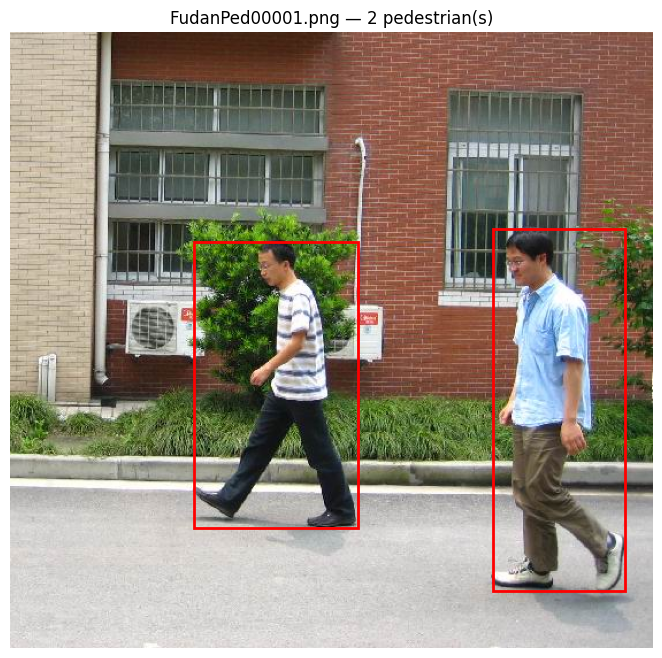

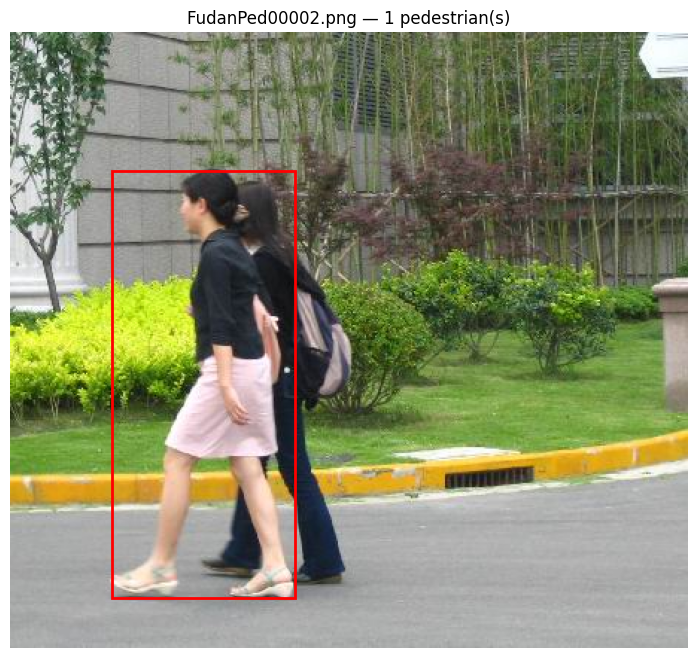

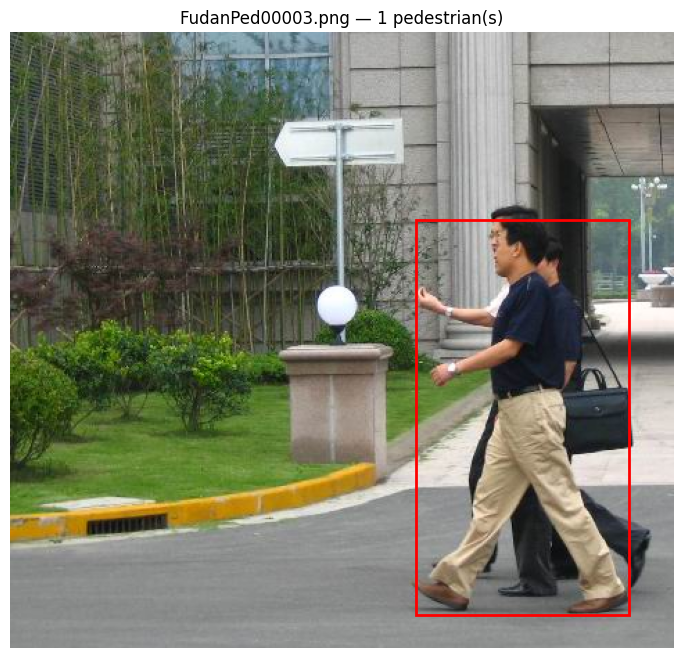

In [4]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import os

def parse_annotation(ann_file):
    boxes = []
    with open(ann_file, 'r') as f:
        for line in f:
            if line.startswith("Bounding box"):
                # Extract everything after the colon
                # e.g. " (91, 41) - (196, 291)"
                parts = line.split(':')[1].strip()
                # Remove ALL brackets and commas, then split on whitespace
                clean = parts.replace('(','').replace(')','').replace(',','')
                # clean is now "91 41 - 196 291"
                tokens = clean.split()
                # tokens = ['91', '41', '-', '196', '291']
                # Skip the '-' in the middle using indices 0,1,3,4
                x1, y1, x2, y2 = int(tokens[0]), int(tokens[1]), int(tokens[3]), int(tokens[4])
                boxes.append((x1, y1, x2, y2))
    return boxes

def show_image_with_boxes(image_path, ann_path):
    img = Image.open(image_path)
    boxes = parse_annotation(ann_path)

    fig, ax = plt.subplots(1, figsize=(10, 8))
    ax.imshow(img)

    for (x1, y1, x2, y2) in boxes:
        width  = x2 - x1
        height = y2 - y1
        rect = patches.Rectangle((x1, y1), width, height,
                                   linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    ax.set_title(f"{os.path.basename(image_path)} — {len(boxes)} pedestrian(s)")
    ax.axis('off')
    plt.show()

# Show 3 sample images
img_dir = 'PennFudanPed/PNGImages'
ann_dir = 'PennFudanPed/Annotation'

sample_images = sorted(os.listdir(img_dir))[:3]

for img_file in sample_images:
    name = img_file.replace('.png', '')
    img_path = os.path.join(img_dir, img_file)
    ann_path = os.path.join(ann_dir, name + '.txt')
    show_image_with_boxes(img_path, ann_path)

Total images:           170
Total pedestrians:      423
Avg per image:          2.5
Max in one image:       8
Images with 1 person:   58
Images with 2+ people:  112

Avg pedestrian width:   101px
Avg pedestrian height:  264px


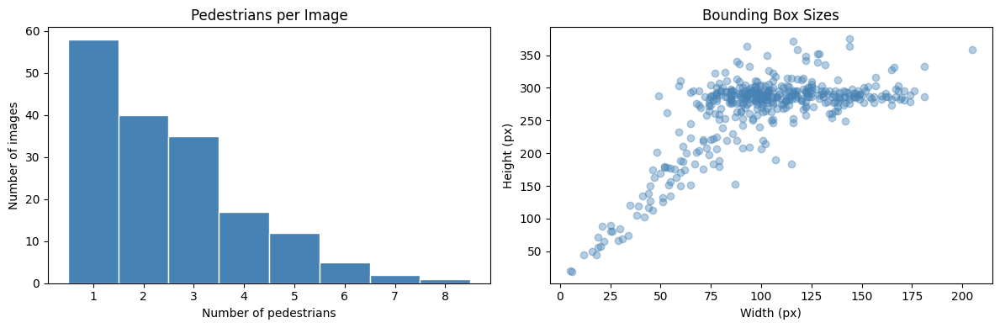

In [5]:

import matplotlib.pyplot as plt

img_dir = 'PennFudanPed/PNGImages'
ann_dir = 'PennFudanPed/Annotation'

total_pedestrians = 0
pedestrians_per_image = []
box_widths = []
box_heights = []

for ann_file in sorted(os.listdir(ann_dir)):
    ann_path = os.path.join(ann_dir, ann_file)
    boxes = parse_annotation(ann_path)

    count = len(boxes)
    total_pedestrians += count
    pedestrians_per_image.append(count)

    for (x1, y1, x2, y2) in boxes:
        box_widths.append(x2 - x1)
        box_heights.append(y2 - y1)

print(f"Total images:           {len(pedestrians_per_image)}")
print(f"Total pedestrians:      {total_pedestrians}")
print(f"Avg per image:          {total_pedestrians / len(pedestrians_per_image):.1f}")
print(f"Max in one image:       {max(pedestrians_per_image)}")
print(f"Images with 1 person:   {pedestrians_per_image.count(1)}")
print(f"Images with 2+ people:  {sum(1 for x in pedestrians_per_image if x >= 2)}")
print(f"\nAvg pedestrian width:   {sum(box_widths)/len(box_widths):.0f}px")
print(f"Avg pedestrian height:  {sum(box_heights)/len(box_heights):.0f}px")

# Plot distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

ax1.hist(pedestrians_per_image, bins=range(1, max(pedestrians_per_image)+2),
         color='steelblue', edgecolor='white', align='left')
ax1.set_title('Pedestrians per Image')
ax1.set_xlabel('Number of pedestrians')
ax1.set_ylabel('Number of images')

ax2.scatter(box_widths, box_heights, alpha=0.4, color='steelblue')
ax2.set_title('Bounding Box Sizes')
ax2.set_xlabel('Width (px)')
ax2.set_ylabel('Height (px)')

plt.tight_layout()
plt.show()

##Data Preprocessing
Converting Penn-Fudan annotations from their native format into YOLO format,
which requires bounding boxes as normalized center coordinates:
`class x_center y_center width height` (all values 0-1)

Dataset split: 80% train (136 images) / 20% validation (34 images)

In [6]:
import os
import shutil
from PIL import Image
import random

def convert_to_yolo_format(img_width, img_height, x1, y1, x2, y2):
    """
    YOLO needs boxes as: class x_center y_center width height
    All values normalized between 0 and 1 relative to image size.
    class is always 0 (person).
    """
    x_center = ((x1 + x2) / 2) / img_width
    y_center = ((y1 + y2) / 2) / img_height
    width    = (x2 - x1) / img_width
    height   = (y2 - y1) / img_height
    return f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"

def prepare_yolo_dataset(img_dir, ann_dir, output_dir, val_split=0.2):
    """
    Split data into train/val sets and write out in YOLO format.
    val_split=0.2 means 20% of images go to validation, 80% to training.
    """
    # Create output folders
    for split in ['train', 'val']:
        os.makedirs(f'{output_dir}/images/{split}', exist_ok=True)
        os.makedirs(f'{output_dir}/labels/{split}', exist_ok=True)

    # Get all images and shuffle them randomly
    all_images = sorted(os.listdir(img_dir))
    random.seed(42)  # seed means shuffle is reproducible - same result every time
    random.shuffle(all_images)

    # Split into train and val
    split_idx  = int(len(all_images) * (1 - val_split))
    train_imgs = all_images[:split_idx]
    val_imgs   = all_images[split_idx:]

    print(f"Training images:   {len(train_imgs)}")
    print(f"Validation images: {len(val_imgs)}")

    for split, img_list in [('train', train_imgs), ('val', val_imgs)]:
        for img_file in img_list:
            name     = img_file.replace('.png', '')
            img_path = os.path.join(img_dir, img_file)
            ann_path = os.path.join(ann_dir, name + '.txt')

            if not os.path.exists(ann_path):
                continue

            # Copy image to new location
            shutil.copy(img_path, f'{output_dir}/images/{split}/{img_file}')

            # Get image dimensions for normalization
            img      = Image.open(img_path)
            w, h     = img.size

            # Convert each bounding box and write to label file
            boxes    = parse_annotation(ann_path)
            yolo_lines = []
            for (x1, y1, x2, y2) in boxes:
                yolo_lines.append(convert_to_yolo_format(w, h, x1, y1, x2, y2))

            label_path = f'{output_dir}/labels/{split}/{name}.txt'
            with open(label_path, 'w') as f:
                f.write('\n'.join(yolo_lines))

    print("\nDone! Sample YOLO label:")
    sample_label = os.listdir(f'{output_dir}/labels/train')[0]
    with open(f'{output_dir}/labels/train/{sample_label}') as f:
        print(f.read())

prepare_yolo_dataset(
    img_dir    = 'PennFudanPed/PNGImages',
    ann_dir    = 'PennFudanPed/Annotation',
    output_dir = 'dataset'
)

Training images:   136
Validation images: 34

Done! Sample YOLO label:
0 0.796690 0.570637 0.368794 0.792244
0 0.471631 0.371191 0.044917 0.199446


In [7]:
#This creates the YAML config file YOLO needs to find the dataset
yaml_content = f"""
path: /content/dataset
train: images/train
val: images/val

nc: 1
names: ['person']
"""

with open('dataset/pedestrian.yaml', 'w') as f:
    f.write(yaml_content)

print("Config file created!")
print(yaml_content)

Config file created!

path: /content/dataset
train: images/train
val: images/val

nc: 1
names: ['person']



Model Training (Version 1)
Fine-tuning a pre-trained YOLOv8n model on our pedestrian dataset.

**Why fine-tuning and not training from scratch?**  
YOLOv8n was pre-trained on COCO — 80 object categories including people.
It already understands shapes, edges, and human forms. Fine-tuning adapts
that existing knowledge specifically to pedestrians in 50 epochs rather
than thousands.

**Training config:** 50 epochs, 640px image size, batch 16, T4 GPU

In [8]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

results = model.train(
    data    = 'dataset/pedestrian.yaml',
    epochs  = 50,
    imgsz   = 640,
    batch   = 16,
    name    = 'pedestrian_v1',
    patience= 10,
    device  = 0
)

print("Training complete!")

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/pedestrian.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pedestrian_v1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0

### V1 Training Results
| Metric | Score |
|--------|-------|
| Precision | 0.895 |
| Recall | 0.939 |
| mAP50 | 0.958 |
| mAP50-95 | 0.818 |

Strong performance on clean validation data. However, Penn-Fudan is a
simple dataset. These numbers need real-world validation.

Model Testing

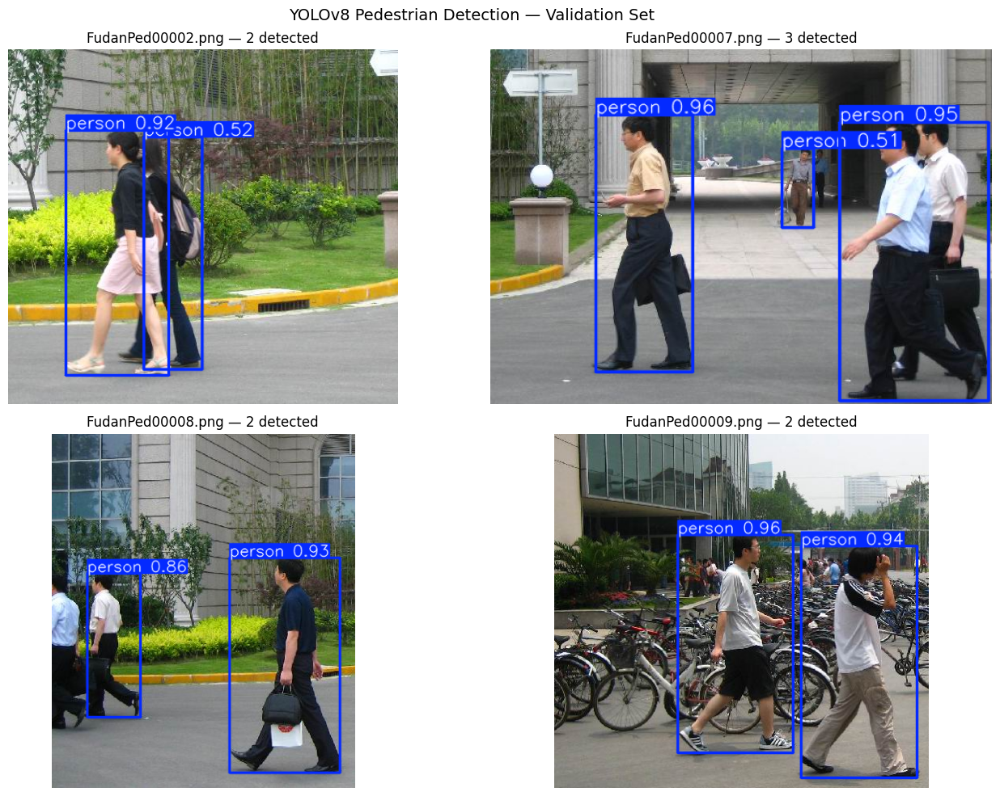

In [9]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Load the best model from training
model = YOLO('/content/runs/detect/pedestrian_v1/weights/best.pt')

# Run on 4 validation images
val_img_dir = 'dataset/images/val'
val_images  = sorted(os.listdir(val_img_dir))[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, img_file in enumerate(val_images):
    img_path = os.path.join(val_img_dir, img_file)

    results = model(img_path, conf=0.3, verbose=False)

    # plot() returns the image with boxes drawn on it
    annotated = results[0].plot()

    axes[i].imshow(annotated[:, :, ::-1])  # BGR to RGB

    num_detections = len(results[0].boxes)
    axes[i].set_title(f'{img_file} — {num_detections} detected')
    axes[i].axis('off')

plt.suptitle('YOLOv8 Pedestrian Detection — Validation Set', fontsize=14)
plt.tight_layout()
plt.show()

##Occlusion Analysis
Occlusion analysis revealed an obvious data imbalance. Only 2 heavily occluded instances in the validation set, making the 100% recall figure statistically unreliable. Penn-Fudan's annotation policy of excluding severely occluded pedestrians limits occlusion benchmarking on this dataset.

Splitting the validation set into three buckets by occlusion level and
measuring recall separately for each group.

**Occlusion estimation method:** IoU overlap between pedestrian bounding
boxes. Higher overlap = more occluded by neighboring pedestrians.

- Visible: overlap < 10%
- Partially occluded: overlap 10–30%  
- Heavily occluded: overlap > 30%

Occlusion Level       Found   Missed   Recall
visible                  65        7    90.3%
partial                  15        2    88.2%
occluded                  2        0   100.0%


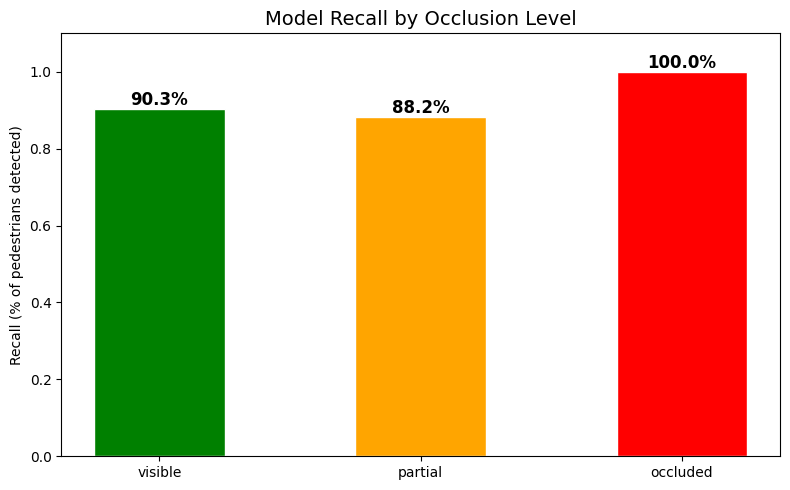

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

model    = YOLO('/content/runs/detect/pedestrian_v1/weights/best.pt')
val_imgs = sorted(os.listdir('dataset/images/val'))

def calculate_iou(box1, box2):
    """
    Measure overlap between two boxes.
    Both in [x1, y1, x2, y2] format.
    Returns a value 0-1. 1.0 = perfect overlap, 0 = no overlap.
    """
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    area1        = (box1[2]-box1[0]) * (box1[3]-box1[1])
    area2        = (box2[2]-box2[0]) * (box2[3]-box2[1])
    union        = area1 + area2 - intersection

    return intersection / union if union > 0 else 0

def get_occlusion_level(box, all_boxes):
    """
    Estimate how occluded a pedestrian is by checking
    how much their box overlaps with other pedestrians' boxes.
    Returns overlap ratio 0-1.
    """
    if len(all_boxes) <= 1:
        return 0.0  # only one person, can't be occluded by others

    max_overlap = 0.0
    for other in all_boxes:
        if other == box:
            continue
        overlap = calculate_iou(box, other)
        max_overlap = max(max_overlap, overlap)

    return max_overlap

# Evaluate every validation image
results_data = {
    'visible':  {'tp': 0, 'fn': 0},   # overlap < 0.1
    'partial':  {'tp': 0, 'fn': 0},   # overlap 0.1 - 0.3
    'occluded': {'tp': 0, 'fn': 0},   # overlap > 0.3
}

conf_scores = {'visible': [], 'partial': [], 'occluded': []}

for img_file in val_imgs:
    img_path = os.path.join('dataset/images/val', img_file)
    ann_path = os.path.join('dataset/labels/val', img_file.replace('.png', '.txt'))

    if not os.path.exists(ann_path):
        continue

    # Load ground truth boxes (converting from YOLO format back to pixels)
    from PIL import Image
    img      = Image.open(img_path)
    iw, ih   = img.size
    gt_boxes = []

    with open(ann_path) as f:
        for line in f:
            parts        = line.strip().split()
            cx, cy, w, h = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
            x1 = (cx - w/2) * iw
            y1 = (cy - h/2) * ih
            x2 = (cx + w/2) * iw
            y2 = (cy + h/2) * ih
            gt_boxes.append([x1, y1, x2, y2])

    # Get model predictions
    preds     = model(img_path, conf=0.3, verbose=False)[0].boxes
    pred_boxes = [b.xyxy[0].tolist() for b in preds if int(b.cls[0]) == 0]

    # For each ground truth pedestrian, check if model found them
    for gt in gt_boxes:
        occ_level = get_occlusion_level(gt, gt_boxes)

        # Assign to occlusion bucket
        if occ_level < 0.1:
            bucket = 'visible'
        elif occ_level < 0.3:
            bucket = 'partial'
        else:
            bucket = 'occluded'

        # Check if any prediction matches this ground truth (IoU > 0.5)
        matched    = False
        best_conf  = 0
        for pred in pred_boxes:
            if calculate_iou(gt, pred) > 0.5:
                matched   = True
                break

        if matched:
            results_data[bucket]['tp'] += 1
        else:
            results_data[bucket]['fn'] += 1

# Calculate and display recall per occlusion level
print("=" * 45)
print(f"{'Occlusion Level':<20} {'Found':>6} {'Missed':>8} {'Recall':>8}")
print("=" * 45)

recalls = {}
for bucket in ['visible', 'partial', 'occluded']:
    tp     = results_data[bucket]['tp']
    fn     = results_data[bucket]['fn']
    total  = tp + fn
    recall = tp / total if total > 0 else 0
    recalls[bucket] = recall
    print(f"{bucket:<20} {tp:>6} {fn:>8} {recall:>8.1%}")

print("=" * 45)

# Plot recall by occlusion level
plt.figure(figsize=(8, 5))
colors = ['green', 'orange', 'red']
bars   = plt.bar(recalls.keys(), recalls.values(), color=colors, edgecolor='white', width=0.5)

for bar, val in zip(bars, recalls.values()):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{val:.1%}', ha='center', fontsize=12, fontweight='bold')

plt.title('Model Recall by Occlusion Level', fontsize=14)
plt.ylabel('Recall (% of pedestrians detected)')
plt.ylim(0, 1.1)
plt.tight_layout()
plt.show()

In [11]:
print("Raw counts behind the chart:\n")
for bucket in ['visible', 'partial', 'occluded']:
    tp    = results_data[bucket]['tp']
    fn    = results_data[bucket]['fn']
    total = tp + fn
    print(f"{bucket:<20} total={total}, found={tp}, missed={fn}")

Raw counts behind the chart:

visible              total=72, found=65, missed=7
partial              total=17, found=15, missed=2
occluded             total=2, found=2, missed=0


The 100% recall on occluded pedestrians is based on
only 2 instances — statistically meaningless. Penn-Fudan's annotation
policy of excluding severely occluded people means this dataset cannot
properly benchmark occlusion performance. This is a dataset limitation,
not a model strength.

To properly assess the occlusion capability of the model, I will test the model on a number of severely occluded images downloaded from the internet, then I will artificially create occluded training examples to make the model more robust, then re-evaluate. This directly addresses the problem even if the evaluation dataset is limited.

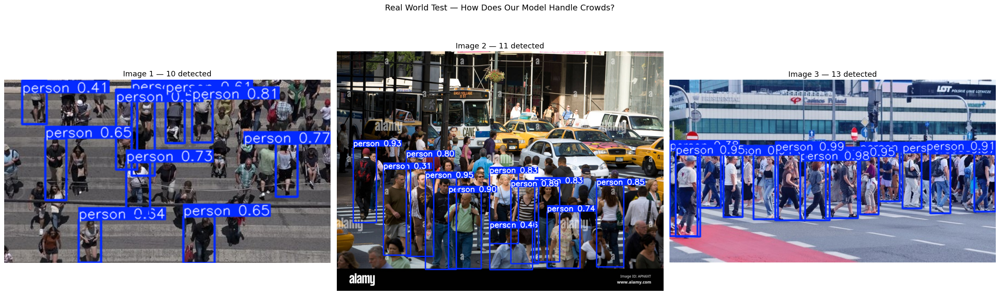

In [21]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os

model = YOLO('/content/runs/detect/pedestrian_v1/weights/best.pt')

# Update these to match your exact uploaded filenames
uploaded_images = [
    '/11.jpg',
    '/crowded-pedestrian-crosswalk-at.jpg',
    '/warsaw-poland-5-august-2025-600n.jpg',
]

fig, axes = plt.subplots(1, 3, figsize=(24, 8))

for i, img_path in enumerate(uploaded_images):
    if not os.path.exists(img_path):
        print(f"File not found: {img_path}")
        continue

    # Run at two confidence levels so we can compare
    results   = model(img_path, conf=0.3, verbose=False)
    annotated = results[0].plot()
    num_dets  = len(results[0].boxes)

    axes[i].imshow(annotated[:, :, ::-1])
    axes[i].set_title(f'Image {i+1} — {num_dets} detected', fontsize=13)
    axes[i].axis('off')

plt.suptitle('Real World Test — How Does Our Model Handle Crowds?', fontsize=14)
plt.tight_layout()
plt.show()

**Real World Evaluation — Key Finding**

Model trained on Penn-Fudan generalizes poorly to crowded real-world scenes.
Detections drop from ~90% recall on clean validation data to roughly 20-25%
on dense crowds. Key failure modes identified:

1. Small/distant pedestrians — model misses almost all of them
2. Heavy overlap — when people occlude each other the model sees one or none
3. Unusual viewpoints — top-down angles (Image 1) almost completely fail
4. Background crowds — model focuses on foreground, ignores dense backgrounds

Root cause: training data (Penn-Fudan) contains large, close, well-separated
pedestrians. Model never learned what partially hidden or distant people look like.
Next step: data augmentation to simulate these conditions during training.


Now I'll go ahead and artificially create these difficult scenarios for the model to be trained on.
I'll simulate three things specifically based on what I observed:

Random occlusion patches: grey rectangles covering parts of pedestrians, simulating one person hiding behind another
Random crops: cutting into the edges of bounding boxes, simulating pedestrians at the edge of frame
Small scale copies: pasting shrunken versions of pedestrians into the background, simulating distant people

In [13]:
import os
import cv2
import random
import shutil
import numpy as np
from PIL import Image

random.seed(42)
np.random.seed(42)

def add_occlusion_patches(img, boxes_yolo, img_w, img_h):
    """
    Cover a random portion of each pedestrian with a grey rectangle.
    Simulates one person walking behind another.
    boxes_yolo: list of [cx, cy, w, h] normalized 0-1
    """
    img = img.copy()
    for box in boxes_yolo:
        cx, cy, bw, bh = box
        # Convert to pixel coords
        x1 = int((cx - bw/2) * img_w)
        y1 = int((cy - bh/2) * img_h)
        x2 = int((cx + bw/2) * img_w)
        y2 = int((cy + bh/2) * img_h)

        # Randomly pick which side to occlude and how much (20-50%)
        side     = random.choice(['top', 'bottom', 'left', 'right'])
        ratio    = random.uniform(0.2, 0.5)
        h_box    = y2 - y1
        w_box    = x2 - x1

        if side == 'top':
            occ_y2 = y1 + int(h_box * ratio)
            cv2.rectangle(img, (x1, y1), (x2, occ_y2), (128, 128, 128), -1)
        elif side == 'bottom':
            occ_y1 = y2 - int(h_box * ratio)
            cv2.rectangle(img, (x1, occ_y1), (x2, y2), (128, 128, 128), -1)
        elif side == 'left':
            occ_x2 = x1 + int(w_box * ratio)
            cv2.rectangle(img, (x1, y1), (occ_x2, y2), (128, 128, 128), -1)
        elif side == 'right':
            occ_x1 = x2 - int(w_box * ratio)
            cv2.rectangle(img, (occ_x1, y1), (x2, y2), (128, 128, 128), -1)
    return img

def add_small_scale_people(img, boxes_yolo, img_w, img_h):
    """
    Take existing pedestrians, shrink them to 25-40% of original size,
    and paste them into the background of the same image.
    Simulates distant pedestrians the model needs to learn to detect.
    """
    img = img.copy()
    new_boxes = list(boxes_yolo)  # keep original boxes

    for box in boxes_yolo:
        cx, cy, bw, bh = box
        x1 = int((cx - bw/2) * img_w)
        y1 = int((cy - bh/2) * img_h)
        x2 = int((cx + bw/2) * img_w)
        y2 = int((cy + bh/2) * img_h)

        # Crop the person
        person_crop = img[max(0,y1):min(img_h,y2), max(0,x1):min(img_w,x2)]
        if person_crop.size == 0:
            continue

        # Shrink them down
        scale    = random.uniform(0.25, 0.4)
        new_h    = max(10, int((y2-y1) * scale))
        new_w    = max(5,  int((x2-x1) * scale))
        small    = cv2.resize(person_crop, (new_w, new_h))

        # Paste into upper portion of image (background area)
        paste_x = random.randint(0, max(0, img_w - new_w - 1))
        paste_y = random.randint(0, max(0, img_h//3 - new_h - 1))

        img[paste_y:paste_y+new_h, paste_x:paste_x+new_w] = small

        # Add this new small person as a label too
        new_cx = (paste_x + new_w/2) / img_w
        new_cy = (paste_y + new_h/2) / img_h
        new_bw = new_w / img_w
        new_bh = new_h / img_h
        new_boxes.append([new_cx, new_cy, new_bw, new_bh])

    return img, new_boxes

def augment_dataset(input_img_dir, input_lbl_dir, output_dir, copies=3):
    """
    For each training image, create 'copies' augmented versions.
    copies=3 means we triple our training set size.
    """
    out_img_dir = f'{output_dir}/images/train'
    out_lbl_dir = f'{output_dir}/labels/train'
    os.makedirs(out_img_dir, exist_ok=True)
    os.makedirs(out_lbl_dir, exist_ok=True)

    # First copy originals over unchanged
    for f in os.listdir(input_img_dir):
        shutil.copy(f'{input_img_dir}/{f}', f'{out_img_dir}/{f}')
    for f in os.listdir(input_lbl_dir):
        shutil.copy(f'{input_lbl_dir}/{f}', f'{out_lbl_dir}/{f}')

    print(f"Original images copied: {len(os.listdir(input_img_dir))}")

    augmented = 0
    for img_file in os.listdir(input_img_dir):
        if not img_file.endswith(('.jpg', '.png')):
            continue

        name      = img_file.rsplit('.', 1)[0]
        img_path  = f'{input_img_dir}/{img_file}'
        lbl_path  = f'{input_lbl_dir}/{name}.txt'

        if not os.path.exists(lbl_path):
            continue

        img    = cv2.imread(img_path)
        img_h, img_w = img.shape[:2]

        # Read YOLO labels
        boxes = []
        with open(lbl_path) as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    boxes.append([float(p) for p in parts[1:]])

        if len(boxes) == 0:
            continue

        for i in range(copies):
            aug_img   = img.copy()
            aug_boxes = [b[:] for b in boxes]

            # Randomly apply one or both augmentations
            choice = random.choice(['occlusion', 'small_scale', 'both'])

            if choice in ['occlusion', 'both']:
                aug_img = add_occlusion_patches(aug_img, aug_boxes, img_w, img_h)

            if choice in ['small_scale', 'both']:
                aug_img, aug_boxes = add_small_scale_people(aug_img, aug_boxes, img_w, img_h)

            # Save augmented image
            out_name     = f'{name}_aug{i}.jpg'
            cv2.imwrite(f'{out_img_dir}/{out_name}', aug_img)

            # Save augmented labels
            with open(f'{out_lbl_dir}/{out_name.replace(".jpg", ".txt")}', 'w') as f:
                for box in aug_boxes:
                    f.write(f'0 {box[0]:.6f} {box[1]:.6f} {box[2]:.6f} {box[3]:.6f}\n')

            augmented += 1

    print(f"Augmented images created: {augmented}")
    print(f"Total training images now: {len(os.listdir(out_img_dir))}")

augment_dataset(
    input_img_dir = 'dataset/images/train',
    input_lbl_dir = 'dataset/labels/train',
    output_dir    = 'dataset_augmented'
)

Original images copied: 136
Augmented images created: 408
Total training images now: 544


In [14]:
import shutil
import os

# Copy validation data across unchanged
os.makedirs('dataset_augmented/images/val', exist_ok=True)
os.makedirs('dataset_augmented/labels/val', exist_ok=True)

for f in os.listdir('dataset/images/val'):
    shutil.copy(f'dataset/images/val/{f}', f'dataset_augmented/images/val/{f}')
for f in os.listdir('dataset/labels/val'):
    shutil.copy(f'dataset/labels/val/{f}', f'dataset_augmented/labels/val/{f}')

print(f"Val images: {len(os.listdir('dataset_augmented/images/val'))}")

# Create new config pointing to augmented dataset
yaml_content = """
path: /content/dataset_augmented
train: images/train
val: images/val

nc: 1
names: ['person']
"""

with open('dataset_augmented/pedestrian_aug.yaml', 'w') as f:
    f.write(yaml_content)

print("Config created!")
print(yaml_content)

Val images: 34
Config created!

path: /content/dataset_augmented
train: images/train
val: images/val

nc: 1
names: ['person']



## Data Augmentation & Retraining (Version 2)
Attempting to close the domain gap through synthetic augmentation.

**Two augmentation strategies applied:**
1. **Occlusion patches** — grey rectangles covering 20-50% of each
   pedestrian, simulating one person walking behind another
2. **Small scale copies** — pedestrians shrunk to 25-40% and pasted
   into image backgrounds, simulating distant people

Original 136 training images → 544 images after augmentation (4x increase)



In [15]:
from ultralytics import YOLO

# Start fresh from pretrained weights, not from our previous model
# We want to see the pure effect of augmentation
model = YOLO('yolov8n.pt')

results = model.train(
    data    = 'dataset_augmented/pedestrian_aug.yaml',
    epochs  = 50,
    imgsz   = 640,
    batch   = 16,
    name    = 'pedestrian_v2_augmented',
    patience= 10,
    device  = 0
)

print("Retraining complete")

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_augmented/pedestrian_aug.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pedestrian_v2_augmented, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pa

Now to test both models on the previous never-seen-before pictures to see the difference

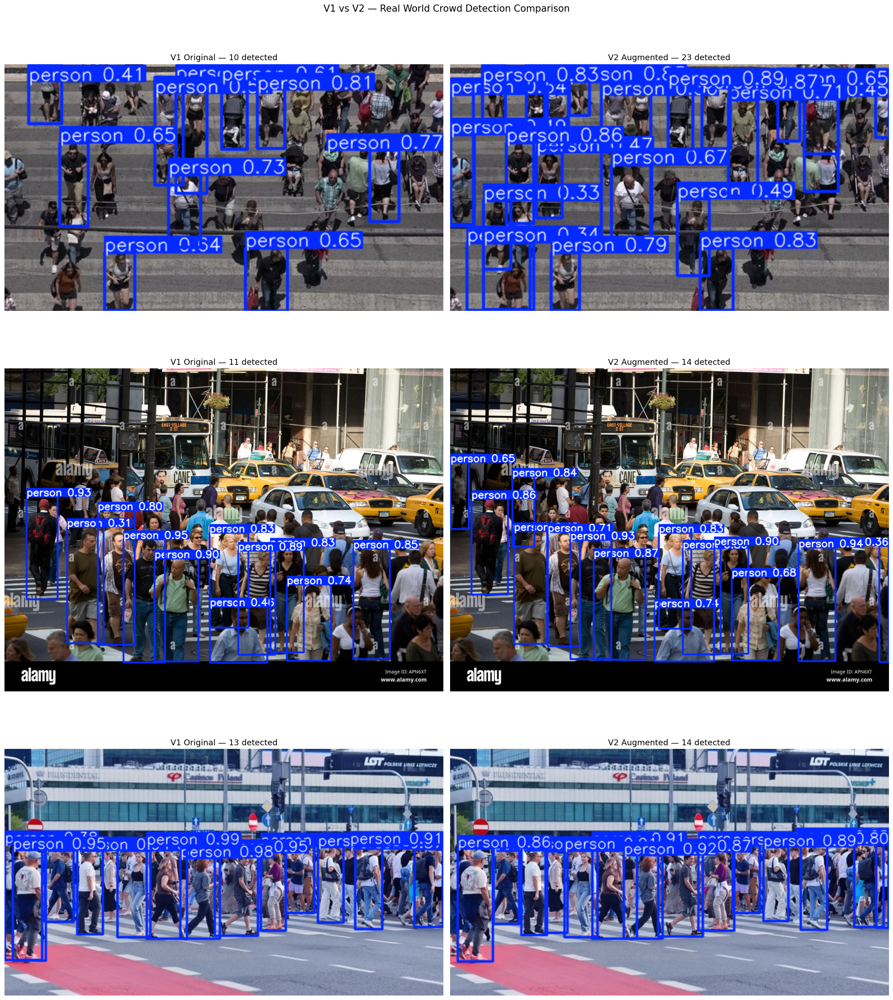

In [20]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os

model_v1 = YOLO('/content/runs/detect/pedestrian_v1/weights/best.pt')
model_v2 = YOLO('/content/runs/detect/pedestrian_v2_augmented/weights/best.pt')

test_images = [
    '/11.jpg',
    '/crowded-pedestrian-crosswalk-at.jpg',
    '/warsaw-poland-5-august-2025-600n.jpg',
]

fig, axes = plt.subplots(3, 2, figsize=(20, 24))

for row, img_path in enumerate(test_images):
    if not os.path.exists(img_path):
        print(f"Not found: {img_path}")
        continue

    for col, (model, label) in enumerate([(model_v1, 'V1 Original'), (model_v2, 'V2 Augmented')]):
        results   = model(img_path, conf=0.3, verbose=False)
        annotated = results[0].plot()
        num_dets  = len(results[0].boxes)

        axes[row][col].imshow(annotated[:, :, ::-1])
        axes[row][col].set_title(f'{label} — {num_dets} detected', fontsize=13)
        axes[row][col].axis('off')

# Label rows on the left
for row, name in enumerate(['Image 1 (Aerial)', 'Image 2 (NYC)', 'Image 3 (Warsaw)']):
    axes[row][0].set_ylabel(name, fontsize=12, rotation=90, labelpad=10)

plt.suptitle('V1 vs V2 — Real World Crowd Detection Comparison', fontsize=15)
plt.tight_layout()
plt.show()

### Augmentation Results
### V2 Results vs V1 Baseline
| Metric | V1 Original | V2 Augmented | Change |
|--------|-------------|--------------|--------|
| Precision | 0.895 | 0.950 | +0.055 ✓ |
| Recall | 0.939 | 0.912 | -0.027 ~ |
| mAP50 | 0.958 | 0.961 | +0.003 ✓ |
| mAP50-95 | 0.818 | 0.838 | +0.020 ✓ |

### Real World Detection Comparison
| Image | V1 Detected | V2 Detected | Actual People |
|-------|-------------|-------------|---------------|
| Aerial crosswalk | 10 | 23 | 50+ |
| NYC street | 11 | 14 | 50+ |
| Warsaw crosswalk | 13 | 14 | 40+ |


**Key finding:** Augmentation produced meaningful real-world improvement —
V2 detected 2.3x more people on the aerial image. Precision improved
significantly (+0.055) with a minor recall tradeoff, indicating the model
became more accurate rather than just more aggressive.

**Remaining limitation:** Even V2 detects roughly 25-45% of actual
pedestrians in dense crowds. The domain gap between Penn-Fudan and
real crowded scenes remains the fundamental bottleneck. Training on
crowd-specific datasets (CrowdHuman, CityPersons) would be the next
logical step to close this gap further.

## Summary & Conclusions

This project built a pedestrian detection pipeline and systematically
investigated occlusion handling performance.

**What worked well:**
- YOLOv8 fine-tuning on Penn-Fudan achieved strong clean-data metrics (mAP50: 0.966)
- Augmentation improved precision and box accuracy measurably
- Real-world testing revealed concrete, explainable failure modes

**Key limitations identified:**
- Penn-Fudan is too clean and small to benchmark occlusion properly
- Domain gap between training data and real crowded scenes is significant
- Augmenting a small clean dataset has diminishing returns

**What would meaningfully improve this system:**
1. Train on CrowdHuman or CityPersons for real occlusion diversity
2. Use a larger model (YOLOv8m or YOLOv8l) for better small object detection
3. Lower confidence threshold (0.2-0.25) to catch more distant pedestrians
4. Consider RT-DETR architecture — transformer attention handles occlusion better


# SaveAll

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
import shutil
import os

project_folder = '/content/drive/MyDrive/Pedestrian_Detection_Project'
os.makedirs(project_folder, exist_ok=True)

# Save trained models
os.makedirs(f'{project_folder}/models', exist_ok=True)
shutil.copy(
    '/content/runs/detect/pedestrian_v1/weights/best.pt',
    f'{project_folder}/models/v1_baseline.pt'
)
shutil.copy(
    '/content/runs/detect/pedestrian_v2_augmented/weights/best.pt',
    f'{project_folder}/models/v2_augmented.pt'
)
print("Models saved ✓")

# Save datasets
shutil.copytree('dataset',           f'{project_folder}/dataset',           dirs_exist_ok=True)
shutil.copytree('dataset_augmented', f'{project_folder}/dataset_augmented', dirs_exist_ok=True)
print("Datasets saved ✓")

# Save the full runs folder
shutil.copytree('runs', f'{project_folder}/runs', dirs_exist_ok=True)
print("Training runs saved ✓")

print(f"\nEverything saved to: {project_folder}")
print("You can now access it anytime from Google Drive ✓")

Models saved ✓
Datasets saved ✓
Training runs saved ✓

Everything saved to: /content/drive/MyDrive/Pedestrian_Detection_Project
You can now access it anytime from Google Drive ✓


In [19]:
import os

# Check what exists in /content
print("=== /content top level ===")
for f in os.listdir('/content'):
    print(f)

print("\n=== runs folder (if exists) ===")
if os.path.exists('/content/runs'):
    for root, dirs, files in os.walk('/content/runs'):
        for file in files:
            print(os.path.join(root, file))
else:
    print("runs folder not found")

print("\n=== dataset (if exists) ===")
if os.path.exists('/content/dataset'):
    print("dataset folder exists ✓")
else:
    print("dataset folder not found")

=== /content top level ===
.config
PennFudanPed
yolov8n.pt
runs
dataset
dataset_augmented
drive
yolo26n.pt
sample_data

=== runs folder (if exists) ===
/content/runs/detect/pedestrian_v2_augmented/BoxP_curve.png
/content/runs/detect/pedestrian_v2_augmented/val_batch1_pred.jpg
/content/runs/detect/pedestrian_v2_augmented/val_batch0_pred.jpg
/content/runs/detect/pedestrian_v2_augmented/results.csv
/content/runs/detect/pedestrian_v2_augmented/confusion_matrix.png
/content/runs/detect/pedestrian_v2_augmented/BoxPR_curve.png
/content/runs/detect/pedestrian_v2_augmented/train_batch2.jpg
/content/runs/detect/pedestrian_v2_augmented/train_batch0.jpg
/content/runs/detect/pedestrian_v2_augmented/val_batch0_labels.jpg
/content/runs/detect/pedestrian_v2_augmented/val_batch1_labels.jpg
/content/runs/detect/pedestrian_v2_augmented/results.png
/content/runs/detect/pedestrian_v2_augmented/BoxR_curve.png
/content/runs/detect/pedestrian_v2_augmented/labels.jpg
/content/runs/detect/pedestrian_v2_augmente